# Primer Dataset
https://www.kaggle.com/datasets/mysarahmadbhat/lung-cancer/code

# Analisis Exploratorio

## 1. Que queremos conseguir

* Como influyen ciertos tipos de habitos en las personas para padecer cancer de pulmon
* Como influyen ciertos sintomas medicos en las personas para padecer cancer de pulmon
* Como influyen ciertos sentimientos en las personas para padecer cancer de pulmon


## 2. Generalidades

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
data = pd.read_csv('/content/survey lung cancer.csv')
data.columns = data.columns.str.strip()
data.columns = data.columns.str.lower()
data.columns = data.columns.str.replace(' ', '_')
columns = data.columns[:]
data[columns] = data[columns].replace({1: 0, 2: 1})
data['lung_cancer'] = data['lung_cancer'].replace({"YES":1, "NO":0})
data.head()

,gender,age,smoking,yellow_fingers,anxiety,peer_pressure,chronic_disease,fatigue,allergy,wheezing,alcohol_consuming,coughing,shortness_of_breath,swallowing_difficulty,chest_pain,lung_cancer
0,M,69,0,1,1,0,0,1,0,1,1,1,1,1,1,1
1,M,74,1,0,0,0,1,1,1,0,0,0,1,1,1,1
2,F,59,0,0,0,1,0,1,0,1,0,1,1,0,1,0
3,M,63,1,1,1,0,0,0,0,0,1,0,0,1,1,0
4,F,63,0,1,0,0,0,0,0,1,0,1,1,0,0,0


In [ ]:
data.dtypes

gender                   object
age                       int64
smoking                   int64
yellow_fingers            int64
anxiety                   int64
peer_pressure             int64
chronic_disease           int64
fatigue                   int64
allergy                   int64
wheezing                  int64
alcohol_consuming         int64
coughing                  int64
shortness_of_breath       int64
swallowing_difficulty     int64
chest_pain                int64
lung_cancer               int64
dtype: object

In [ ]:
data.dtypes.value_counts()

int64     15
object     1
dtype: int64

In [ ]:
data.select_dtypes(include=['int64']).nunique()

age                      39
smoking                   2
yellow_fingers            2
anxiety                   2
peer_pressure             2
chronic_disease           2
fatigue                   2
allergy                   2
wheezing                  2
alcohol_consuming         2
coughing                  2
shortness_of_breath       2
swallowing_difficulty     2
chest_pain                2
lung_cancer               2
dtype: int64

In [ ]:
data.isnull().values.any()

False

In [ ]:
data.duplicated().sum()

33

In [ ]:
data = data.drop_duplicates()
data.shape

(276, 16)

In [ ]:
data.describe().loc[['min','max']]

,age,smoking,yellow_fingers,anxiety,peer_pressure,chronic_disease,fatigue,allergy,wheezing,alcohol_consuming,coughing,shortness_of_breath,swallowing_difficulty,chest_pain,lung_cancer
min,21.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,87.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


## 3. Revision de los datos continuos, estadistica descriptiva

In [ ]:
!pip install fitter
from fitter import Fitter, get_common_distributions, get_distributions

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
lognorm,0.037805,1246.865162,1257.726364,inf,0.067695,0.152193
norm,0.037805,1244.863947,1252.104749,inf,0.067695,0.152191
gamma,0.037855,1280.049624,1290.910826,inf,0.058820,0.284021
chi2,0.037957,1278.003255,1288.864458,inf,0.063048,0.213417
cauchy,0.041164,1015.094377,1022.335178,inf,0.087987,0.026174


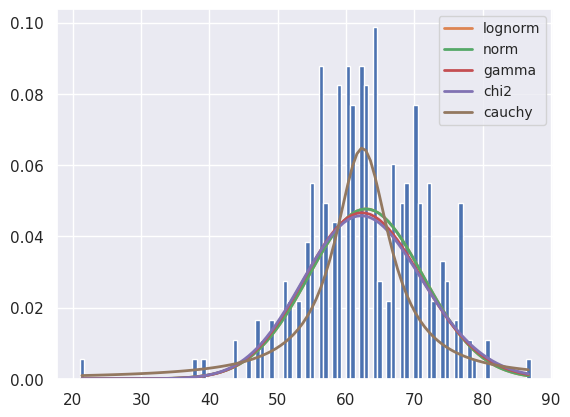

In [ ]:
fit = data[data.columns[1]].values

f = Fitter(fit,distributions= get_common_distributions())
f.fit()
f.summary()

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
lognorm,0.037805,1246.865162,1257.726364,inf,0.067695,0.152193
norm,0.037805,1244.863947,1252.104749,inf,0.067695,0.152191
gamma,0.037855,1280.049624,1290.910826,inf,0.058820,0.284021
beta,0.038305,1159.229420,1173.711023,inf,0.086511,0.030213
burr,0.038543,1136.357152,1150.838755,inf,0.070843,0.119370


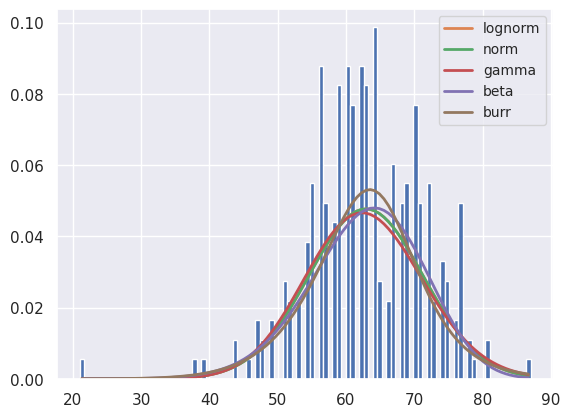

In [ ]:
fit = data[data.columns[1]].values

f = Fitter(fit,distributions=['gamma',
                          'lognorm',
                          "beta",
                          "burr",
                          "norm"])
           #distributions= get_common_distributions())
f.fit()
f.summary()

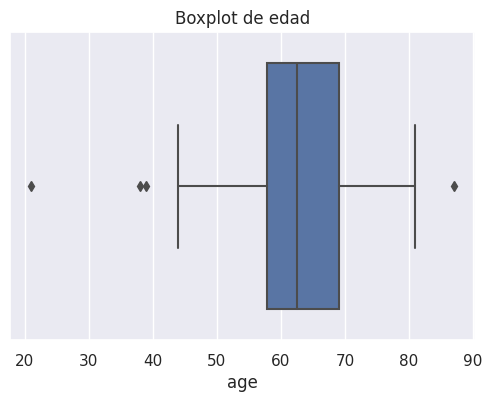

In [ ]:
plt.figure(figsize = (6,4))
sns.boxplot(x=data["age"])
plt.title("Boxplot de edad", fontsize = 12)
plt.show()

In [ ]:
bp = pd.DataFrame.boxplot(data["age"], return_type='dict')
whiskers = [whiskers.get_ydata() for whiskers in bp["whiskers"]]
print(data[data.columns[1]].describe())
print("lower whiskers: "+str(whiskers[0]))
print("upper whiskers: "+str(whiskers[1]))
plt.close()

count    276.000000
mean      62.909420
std        8.379355
min       21.000000
25%       57.750000
50%       62.500000
75%       69.000000
max       87.000000
Name: age, dtype: float64
lower whiskers: [57.75 44.  ]
upper whiskers: [69. 81.]


### 3.1 Correlacion

<ipython-input-114-454e1e9633d3>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot = True, cmap="RdBu", fmt=".3f")


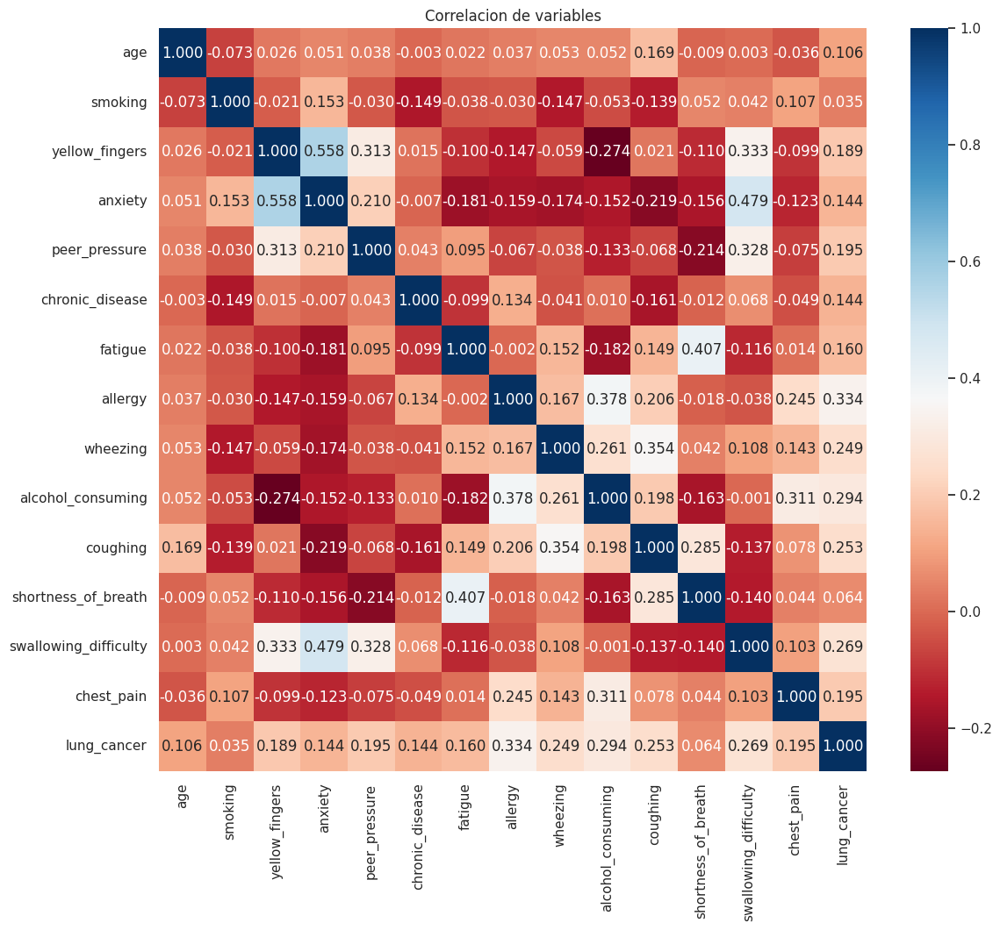

In [ ]:
plt.figure(figsize = (13,11))
sns.heatmap(data.corr(), annot = True, cmap="RdBu", fmt=".3f")
plt.title("Correlacion de variables", fontsize = 12)
plt.show()

<ipython-input-115-f73204e981ec>:2: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data,x='lung_cancer',shade=True,fill=True,color='red')


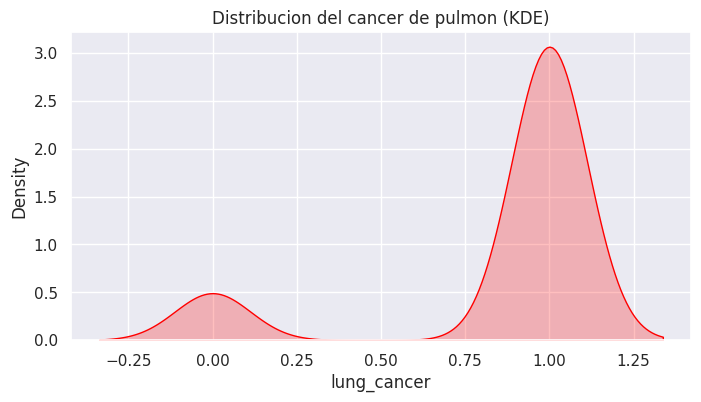

In [ ]:
plt.figure(figsize=(8,4))
sns.kdeplot(data=data,x='lung_cancer',shade=True,fill=True,color='red')
plt.title('Distribucion del cancer de pulmon (KDE)')
plt.show()

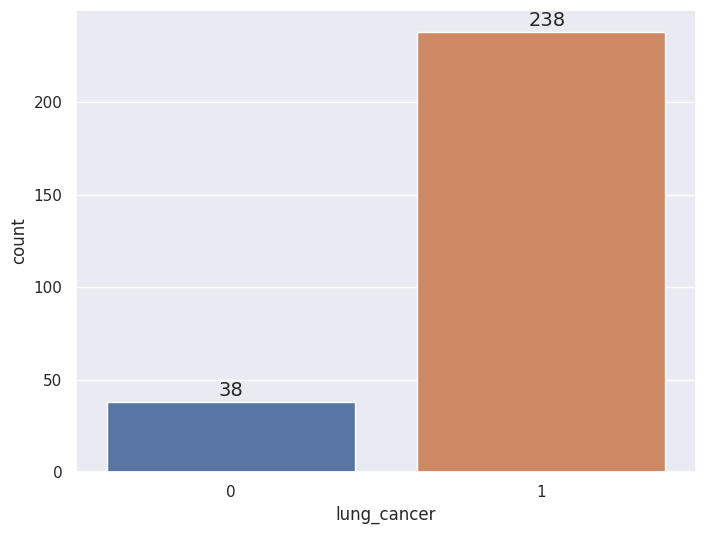

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(x=data['lung_cancer'])
target_count = data.lung_cancer.value_counts()
plt.annotate(text=str(target_count[0]), xy=(-0.04,3+target_count[0]), size=14)
plt.annotate(text=str(target_count[1]), xy=(0.96,3+target_count[1]), size=14)
plt.show()

## 4. Interacciones entre datos

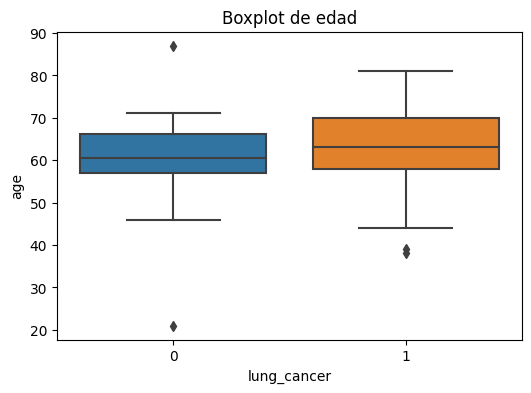

In [ ]:
plt.figure(figsize = (6,4))
sns.boxplot(x=data["lung_cancer"],y=data["age"])
plt.title("Boxplot de edad", fontsize = 12)
plt.show()

In [ ]:
# bp = data.boxplot(column=['age'],by="lung_cancer", return_type='dict')
# whiskers2 = [whisker.get_ydata() for whisker in bp["whiskers"]]
print("Tienen Cancer")
print(data[data['lung_cancer']==1]['age'].describe())
print("No tienen Cancer")
print(data[data['lung_cancer']==0]['age'].describe())
# print("lower whiskers: "+str(whiskers[0]))
# print("upper whiskers: "+str(whiskers[1]))
# plt.close()
# bp

Tienen Cancer
count    238.000000
mean      63.264706
std        8.105924
min       38.000000
25%       58.000000
50%       63.000000
75%       70.000000
max       81.000000
Name: age, dtype: float64
No tienen Cancer
count    38.000000
mean     60.684211
std       9.751245
min      21.000000
25%      57.000000
50%      60.500000
75%      66.250000
max      87.000000
Name: age, dtype: float64


Text(0.5, 1.0, 'Gráfico de Violín del Cancer de Pulmon respecto la Edad')

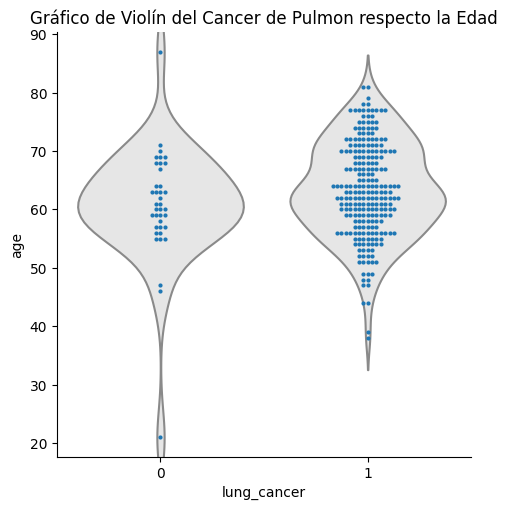

In [ ]:
sns.catplot(data=data, x="lung_cancer", y="age", kind="violin", color=".9", inner=None)
sns.swarmplot(data=data, x="lung_cancer", y="age", size=3)
plt.title('Gráfico de Violín del Cancer de Pulmon respecto la Edad')


In [ ]:
data.groupby(by=["lung_cancer","age"]).size()

lung_cancer  age
0            21      1
             46      1
             47      1
             55      3
             56      2
             57      3
             58      1
             59      4
             60      3
             61      2
             62      1
             63      4
             64      2
             67      1
             68      3
             69      3
             70      1
             71      1
             87      1
1            38      1
             39      1
             44      2
             47      2
             48      2
             49      3
             51      5
             52      4
             53      4
             54      7
             55      7
             56     14
             57      6
             58      7
             59     11
             60     13
             61     12
             62     15
             63     11
             64     16
             65      5
             66      4
             67     10
             68  

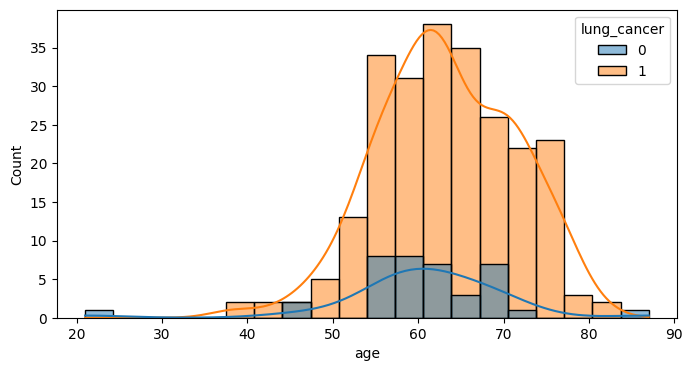

In [ ]:
plt.figure(figsize=(8,4))
sns.histplot(data=data,x='age',hue="lung_cancer",kde=True,fill=True,color='red')
plt.show()

gender,F,M
lung_cancer,,
0,21,17
1,113,125


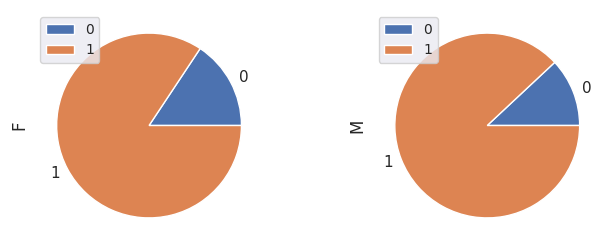

In [ ]:
pie_data = data.groupby(by=["gender","lung_cancer"]).size().unstack(fill_value=0,level=0)
pie_data.plot.pie(subplots=True,figsize=(8, 3))
data.groupby(by=["gender","lung_cancer"]).size().unstack(fill_value=0,level=0)

* Columnas para clasificar: 'age','gender'
* Columnas de habitos: 'smoking', 'alcohol_consuming'
* Columnas de sintomas: 'yellow_fingers', 'chronic_disease', 'fatigue', 'allergy', 'wheezing', 'coughing', 'shortness_of_breath', 'swallowing_difficulty', 'chest_pain'
* Columnas de estados: , 'anxiety', 'peer_pressure'

smoking  lung_cancer
0        0               19
         1              107
1        0               19
         1              131
dtype: int64

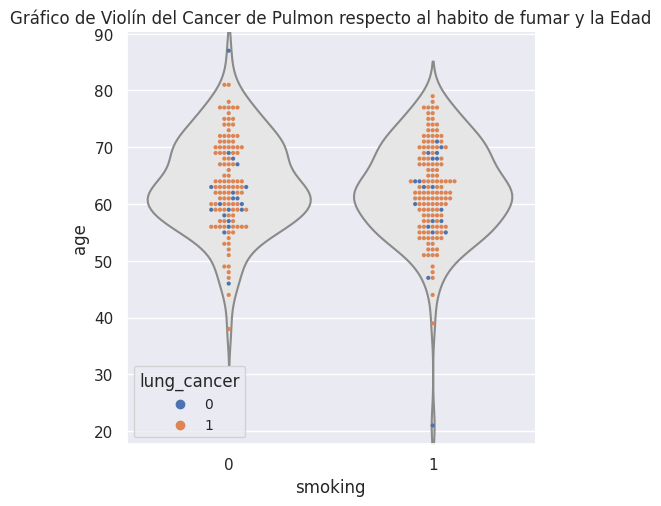

In [ ]:
sns.catplot(data=data, x="smoking", y="age", kind="violin", color=".9", inner=None)
sns.swarmplot(data=data, x="smoking", y="age", hue='lung_cancer', size=3)
plt.title('Gráfico de Violín del Cancer de Pulmon respecto al habito de fumar y la Edad')
data.groupby(by=["smoking","lung_cancer"]).size()

<ipython-input-24-519a78722146>:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data,x='smoking',hue="lung_cancer",shade=True,fill=True,color='red')


smoking  lung_cancer
0        0               19
         1              107
1        0               19
         1              131
dtype: int64

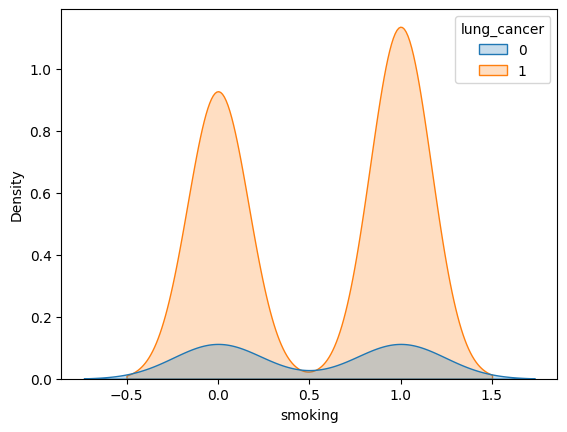

In [ ]:
sns.kdeplot(data=data,x='smoking',hue="lung_cancer",shade=True,fill=True,color='red')
data.groupby(by=["smoking","lung_cancer"]).size()

gender  smoking  lung_cancer
F       0        0              11
                 1              53
        1        0              10
                 1              60
M       0        0               8
                 1              54
        1        0               9
                 1              71
dtype: int64

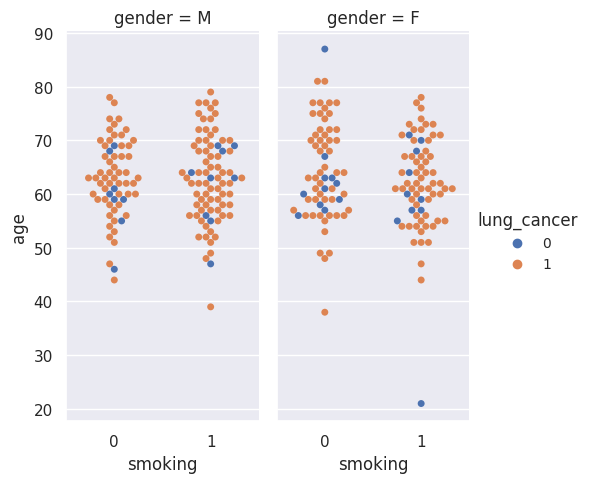

In [ ]:
sns.catplot(
    data=data, kind="swarm",
    x="smoking", y="age", hue="lung_cancer", col="gender",
    aspect=.5
)
data.groupby(by=["gender","smoking","lung_cancer"]).size()

alcohol_consuming  lung_cancer
0                  0               32
                   1              105
1                  0                7
                   1              165
dtype: int64

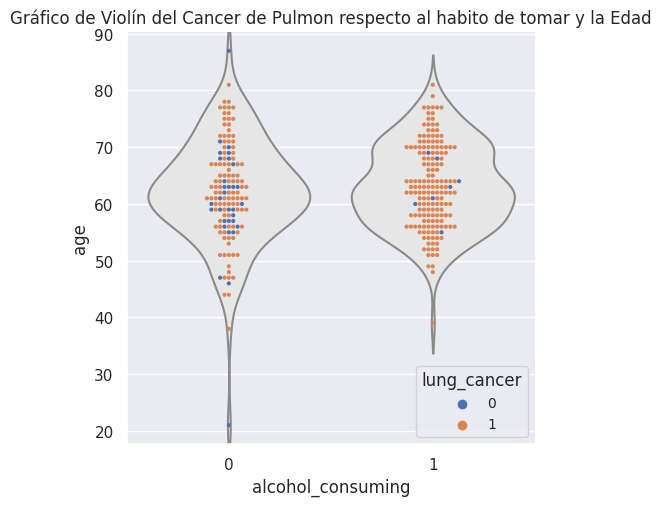

In [ ]:
sns.catplot(data=data, x="alcohol_consuming", y="age", kind="violin", color=".9", inner=None)
sns.swarmplot(data=data, x="alcohol_consuming", y="age", hue='lung_cancer', size=3)
plt.title('Gráfico de Violín del Cancer de Pulmon respecto al habito de tomar y la Edad')
data.groupby(by=["alcohol_consuming","lung_cancer"]).size()

<ipython-input-99-e1d30bb9ccb5>:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data,x='alcohol_consuming',hue="lung_cancer",shade=True,fill=True,color='red')


alcohol_consuming  lung_cancer
0                  0               32
                   1              105
1                  0                7
                   1              165
dtype: int64

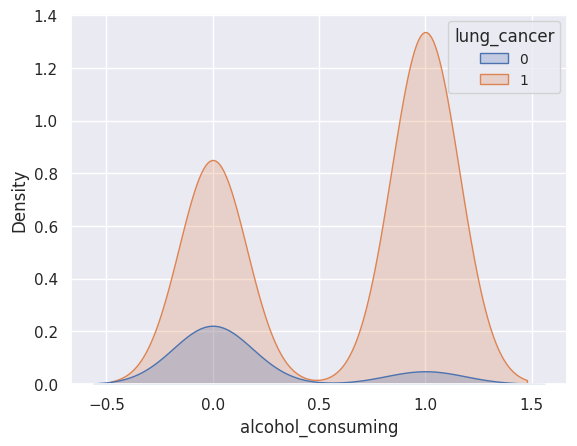

In [ ]:
sns.kdeplot(data=data,x='alcohol_consuming',hue="lung_cancer",shade=True,fill=True,color='red')
data.groupby(by=["alcohol_consuming","lung_cancer"]).size()

gender  alcohol_consuming  lung_cancer
F       0                  0               21
                           1               69
        1                  1               44
M       0                  0               10
                           1               24
        1                  0                7
                           1              101
dtype: int64

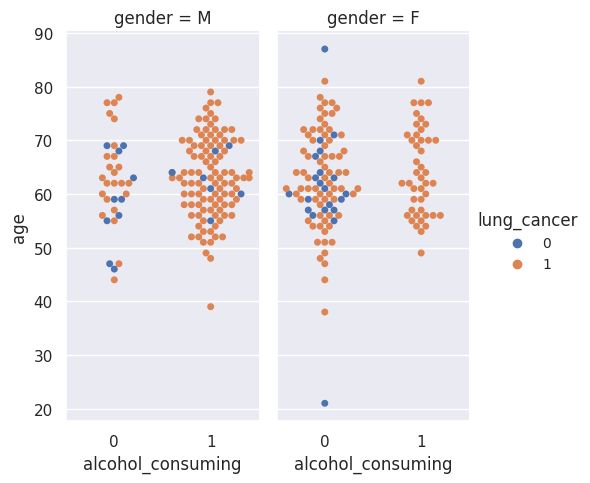

In [ ]:
sns.catplot(
    data=data, kind="swarm",
    x="alcohol_consuming", y="age", hue="lung_cancer", col="gender",
    aspect=.5
)
data.groupby(by=["gender","alcohol_consuming","lung_cancer"]).size()

In [ ]:
plt.figure(figsize=(8,4))
sns.bloxplot(data=data,x='age',hue="lung_cancer",shade=True,fill=True,color='red')
plt.show()

anxiety  lung_cancer
0        0               26
         1              113
1        0               12
         1              125
dtype: int64

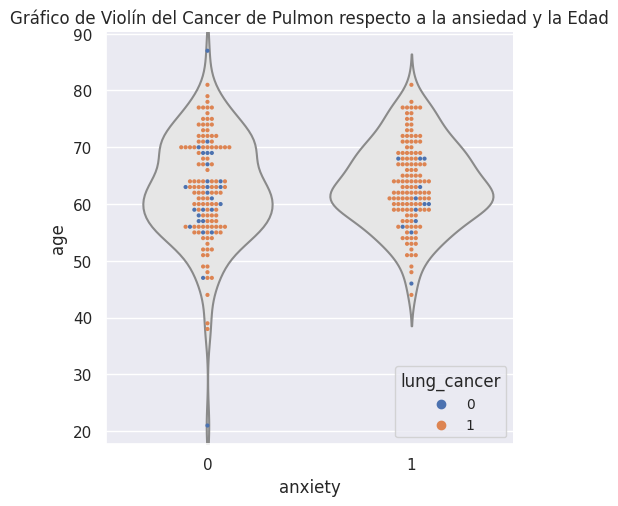

In [ ]:
sns.catplot(data=data, x="anxiety", y="age", kind="violin", color=".9", inner=None)
sns.swarmplot(data=data, x="anxiety", y="age", hue='lung_cancer', size=3)
plt.title('Gráfico de Violín del Cancer de Pulmon respecto a la ansiedad y la Edad')
data.groupby(by=["anxiety","lung_cancer"]).size()

anxiety  lung_cancer
0        0               26
         1              113
1        0               12
         1              125
dtype: int64


<ipython-input-35-52a9b518e7be>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data,x='anxiety',hue="lung_cancer",shade=True,fill=True,color='red')


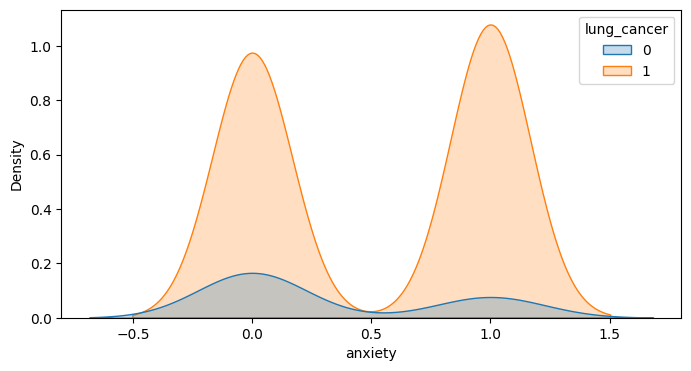

In [ ]:
print(data.groupby(by=["anxiety","lung_cancer"]).size())
plt.figure(figsize=(8,4))
sns.kdeplot(data=data,x='anxiety',hue="lung_cancer",shade=True,fill=True,color='red')

plt.show()

gender  anxiety  lung_cancer
F       0        0              17
                 1              40
        1        0               4
                 1              73
M       0        0               9
                 1              73
        1        0               8
                 1              52
dtype: int64

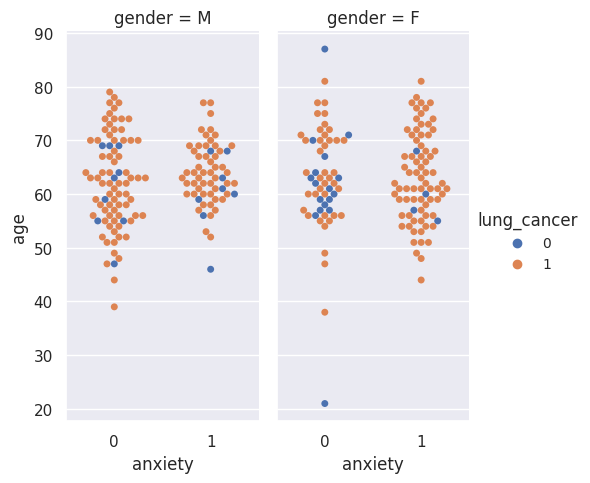

In [ ]:
sns.catplot(
    data=data, kind="swarm",
    x="anxiety", y="age", hue="lung_cancer", col="gender",
    aspect=.5
)
data.groupby(by=["gender","anxiety","lung_cancer"]).size()

anxiety  lung_cancer
0        0               26
         1              113
1        0               12
         1              125
dtype: int64


<ipython-input-41-2004f8bdb128>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data.loc[data['gender'] == 'F'],x='anxiety',hue="lung_cancer",shade=True,fill=True,color='red')


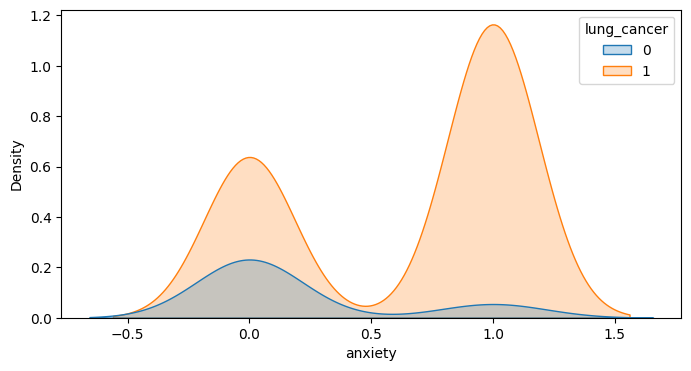

In [ ]:
print(data.groupby(by=["anxiety","lung_cancer"]).size())
plt.figure(figsize=(8,4))
sns.kdeplot(data=data.loc[data['gender'] == 'F'],x='anxiety',hue="lung_cancer",shade=True,fill=True,color='red')
plt.show()

peer_pressure  lung_cancer
0              0               28
               1              108
1              0               10
               1              130
dtype: int64

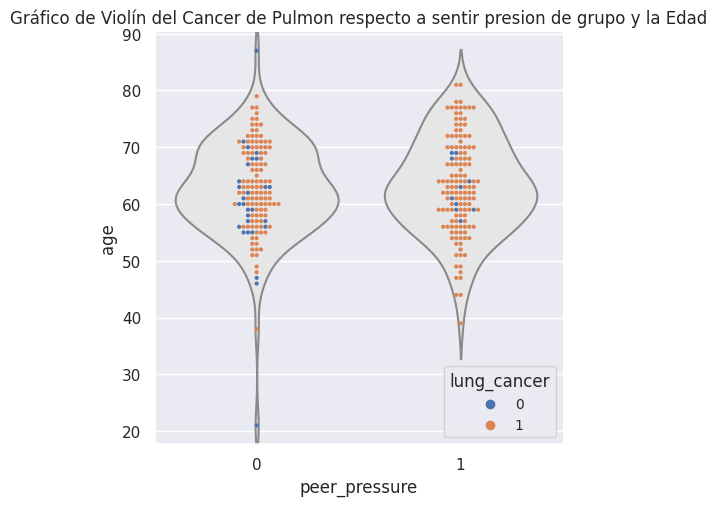

In [ ]:
sns.catplot(data=data, x="peer_pressure", y="age", kind="violin", color=".9", inner=None)
sns.swarmplot(data=data, x="peer_pressure", y="age", hue='lung_cancer', size=3)
plt.title('Gráfico de Violín del Cancer de Pulmon respecto a sentir presion de grupo y la Edad')
data.groupby(by=["peer_pressure","lung_cancer"]).size()

peer_pressure  lung_cancer
0              0               29
               1              125
1              0               10
               1              145
dtype: int64


<ipython-input-97-23b8338776aa>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data,x='peer_pressure',hue="lung_cancer",shade=True,fill=True,color='red')


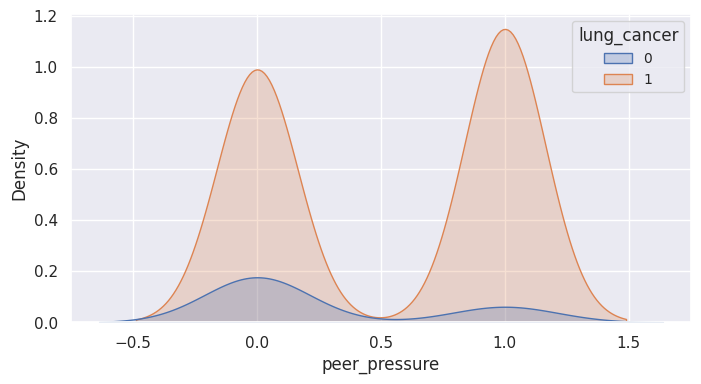

In [ ]:
print(data.groupby(by=["peer_pressure","lung_cancer"]).size())
plt.figure(figsize=(8,4))
sns.kdeplot(data=data,x='peer_pressure',hue="lung_cancer",shade=True,fill=True,color='red')
plt.show()

gender  peer_pressure  lung_cancer
F       0              0              18
                       1              30
        1              0               3
                       1              83
M       0              0              10
                       1              78
        1              0               7
                       1              47
dtype: int64

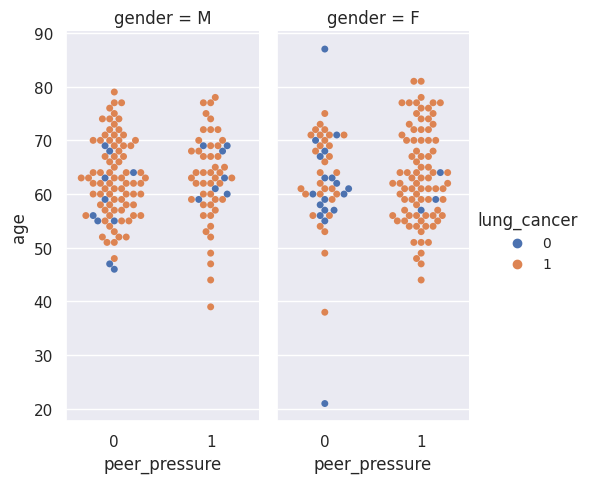

In [ ]:
sns.catplot(
    data=data, kind="swarm",
    x="peer_pressure", y="age", hue="lung_cancer", col="gender",
    aspect=.5
)
data.groupby(by=["gender","peer_pressure","lung_cancer"]).size()

peer_pressure  lung_cancer
0              0               28
               1              108
1              0               10
               1              130
dtype: int64


<ipython-input-39-bb7e5c4ad1a2>:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data.loc[data['gender'] == 'F'],x='peer_pressure',hue="lung_cancer",shade=True,fill=True,color='red')


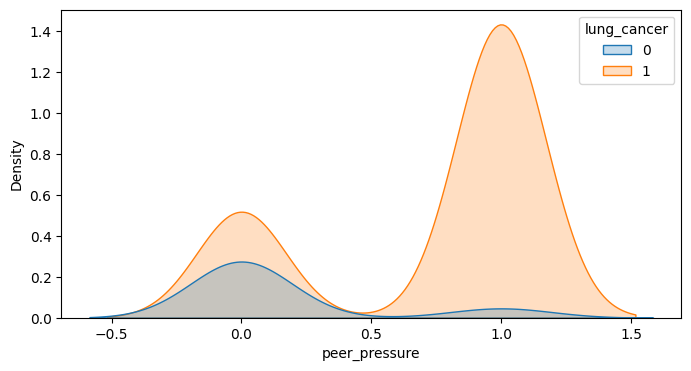

In [ ]:
print(data.groupby(by=["peer_pressure","lung_cancer"]).size())
plt.figure(figsize=(8,4))
sns.kdeplot(data=data.loc[data['gender'] == 'F'],x='peer_pressure',hue="lung_cancer",shade=True,fill=True,color='red')
plt.show()

In [ ]:
constant_features = data.nunique()
constant_features = constant_features.loc[constant_features.values==2].index
constant_features[:-1]

Index(['gender', 'smoking', 'yellow_fingers', 'anxiety', 'peer_pressure',
       'chronic_disease', 'fatigue', 'allergy', 'wheezing',
       'alcohol_consuming', 'coughing', 'shortness_of_breath',
       'swallowing_difficulty', 'chest_pain'],
      dtype='object')

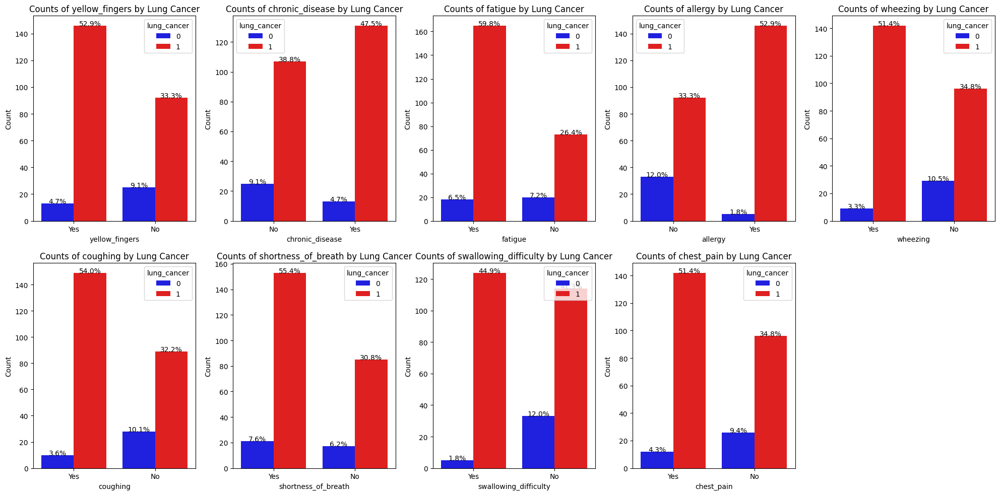

In [ ]:
data_copy = data.copy()
health_factors = ['yellow_fingers', 'chronic_disease', 'fatigue', 'allergy', 'wheezing', 'coughing', 'shortness_of_breath', 'swallowing_difficulty', 'chest_pain']
plt.figure(figsize=(20, 10))
for i, factor in enumerate(health_factors):
    plt.subplot(2, 5, i + 1)
    data_copy[factor] = data_copy[factor].map({0: 'No', 1: 'Yes'})
    palette = ['blue','red']
    ax = sns.countplot(data=data_copy, x=factor, hue='lung_cancer', palette=palette)
    plt.title(f'Counts of {factor} by Lung Cancer')
    plt.xlabel(factor)
    plt.ylabel('Count')
    total_count = len(data_copy)
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height/total_count*100:.1f}%', (p.get_x() + p.get_width() / 2., height), ha='center')
sns.set(rc={'legend.fontsize': 10})
plt.tight_layout()
plt.show()

In [ ]:
from scipy.stats import chi2_contingency
contingency_table = pd.crosstab(data_copy['yellow_fingers'] + data_copy['chronic_disease'] + data_copy['allergy'] + data_copy['fatigue'] + data_copy['wheezing'] + data_copy['coughing'] + data_copy['shortness_of_breath'] + data_copy['swallowing_difficulty'] + data_copy['chest_pain'], data_copy['lung_cancer'])
chi2, p, _, _ = chi2_contingency(contingency_table)
alpha = 0.05
if p < alpha:
    print("There is a significant relationship between health factors and lung cancer.")
else:
    print("There is no significant relationship between health factors and lung cancer.")

There is a significant relationship between health factors and lung cancer.


## Algunas Conclusiones
* Sobre como influyen ciertos tipos de habitos en las personas para padecer cancer de pulmon
* Sobre como influyen ciertos sintomas medicos en las personas para padecer cancer de pulmon
* Sobre como influyen ciertos sentimientos en las personas para padecer cancer de pulmon

1. Sobre fumar y beber alcohol:
  * Hay una cantidad ligeramente mayor de personas que fuman y tienen cancer de pulmon que las que no fuman y tienen cancer de pulmon (107 a 131).
  * Hay una cantidad minimamente menor de personas del genero femenino que tienen cancer de pulmon que las personas del genero masculino que tienen cancer de pulmon (113 a 125).
  * La cantidad personas que consumen bebidas alcoholicas y tienen cancer de pulmon es considerablemente mayor a las que no consumen y tienen cancer de pulmon (165 a 105).
  * Todas las personas del genero femenino que consumen bebidas alcoholicas tienen cancer de pulmon (44).
  * La mayoria de personas del genero masculino que consumen bebidas alcoholicas tienen cancer de pulmon (101).

2. Sobre los sintomas medicos:
  * La mayoria de personas que padecen estos sintomas presentan tambien cancer de pulmon.
3. Sobre los sentimientos (ansiedad y presion de grupo):
  * Hay una cantidad ligeramente mayor de personas con ansiedad que tienen cancer de pulmon que las personas sin ansiedad con cancer de pulmon (125 a 113).
  * La mayoria de personas del genero femenino con ansiedad tienen cancer de pulmon (73)
  * Hay una cantidad ligeramente mayor de personas que sienten presion de grupo y tienen cancer de pulmon que las que no y tienen cancer de pulmon (108 a 130).
  * La mayoria de personas del genero femenino que sienten presion de grupo tienen cancer de pulmon (47)

4. Sobre el dataset en general:
  * Todos los datos son categoricos (15) excepto la edad que es continua.
  * No hay valores nulos ni unicos.
  * Hay 33 valores duplicados.
  * La edad maxima y minima, es 87 y 21.
  * La edad se ajusta mas a una distribucion normal siendo la segunda mejor la distrubucion lognorm
  * Hay outliers en la edad.
  * La mitad de las personas del dataset son de edades entre 57.75 y 69 años.
  * Sobre la matriz de correlacion, respecto a la variable objetivo; todas las demas variables son independientes.
  * Hay mas personas con cancer de pulmon que las que no. (Desbalanceado)

# Modelamiento

## Imbalanced Data

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from collections import Counter

data['gender'] = data['gender'].replace({"F":1, "M":0})

X = data.drop('lung_cancer',axis=1)
Y = data['lung_cancer']

### SMOTE AND ROS

In [ ]:
ros = RandomOverSampler(sampling_strategy='minority')
smote = SMOTE(sampling_strategy='minority')
X_resampled, Y_resampled = ros.fit_resample(X, Y)
#X_resampled, Y_resampled = smote.fit_resample(X, Y)
print("Counter:", Counter(Y_resampled))

Counter: Counter({1: 238, 0: 238})


##

In [ ]:
# from sklearn.model_selection import train_test_split

In [ ]:
# trainX, testX, trainY, testY = train_test_split(X_resampled, Y_resampled, train_size=.7, test_size = .3)

## Testing and Explanation

In [ ]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from numpy import mean, std
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

In [ ]:
!pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=79251a3fa746e682cedb6ef1a9c7e23e9bb92f1bf782da39e6f9d89619edf7fb
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


### SVC

#### Cross Validation k5 and GridSearch

In [ ]:
grid = {
    'C':[1,10,100],
    'gamma':[1,0.1,0.001],
    'kernel':['linear','rbf']
    }
svc_cv = GridSearchCV(estimator=SVC(probability=True), param_grid=grid, cv= 5,scoring = ['accuracy', 'f1','recall', 'precision'],refit='accuracy')
# svc_cv.fit(trainX, trainY)
svc_cv.fit(X_resampled, Y_resampled)

GridSearchCV(cv=5, estimator=SVC(probability=True),
             param_grid={'C': [1, 10, 100], 'gamma': [1, 0.1, 0.001],
                         'kernel': ['linear', 'rbf']},
             refit='accuracy',
             scoring=['accuracy', 'f1', 'recall', 'precision'])

In [ ]:
svc_cv.best_params_

{'C': 1, 'gamma': 1, 'kernel': 'rbf'}

In [ ]:
svc_cv.cv_results_

{'mean_fit_time': array([ 0.10206304,  0.03780317,  0.13712721,  0.04884529,  0.2003057 ,
         0.07056761,  0.9546875 ,  0.03104763,  0.66688352,  0.02531614,
         1.08740869,  0.11885538, 10.4014215 ,  0.03079972,  6.67084961,
         0.02310901,  5.97667656,  0.03084116]),
 'std_fit_time': array([2.15109179e-02, 2.08222899e-03, 6.99469333e-02, 1.89536723e-03,
        2.72336134e-02, 1.24705227e-03, 4.17851069e-01, 5.25419709e-04,
        1.38016590e-01, 4.21730450e-03, 6.33462690e-01, 8.07675556e-02,
        4.65843082e+00, 7.38125895e-04, 3.33745595e+00, 7.26530998e-04,
        2.18219342e+00, 2.80878551e-03]),
 'mean_score_time': array([0.00674152, 0.00953732, 0.00828371, 0.01244273, 0.0106039 ,
        0.01419106, 0.00729032, 0.0090836 , 0.00663223, 0.00709963,
        0.01573014, 0.02106924, 0.0106873 , 0.00787148, 0.00722356,
        0.00709982, 0.00677791, 0.00807028]),
 'std_score_time': array([0.00023166, 0.00239872, 0.00302271, 0.00056394, 0.00027701,
        0.0003

In [ ]:
# svc = SVC(probability=True, C= 1, gamma= 1, kernel= 'rbf')
# cv = cross_val_score(svc_cv,X_resampled, Y_resampled,cv=5)
# print(mean(cv), '+/-', std(cv))

#### Test And Metrics

In [ ]:
# from sklearn.metrics import (accuracy_score,
#                              f1_score,
#                              classification_report)

In [ ]:
# # svc.fit(trainX,trainY)
# y_pred_svc = svc_cv.predict(testX)

# #assess accuracy
# svc_cv_acc = accuracy_score(testY, y_pred_svc)
# svc_cv_f1 = f1_score(testY, y_pred_svc)
# svc_cv_report = classification_report(testY, y_pred_svc)
# print('SVC test accuracy: {}'.format(svc_cv_acc))
# print('SVC test f1: {}'.format(svc_cv_f1))
# print('SVC classification report: ')
# print(svc_cv_report)

In [ ]:
def get_metrics(model, scoring):
  scores = []
  for score in scoring:
    idx = np.where(model.cv_results_['rank_test_'+score] == 1)
    scores = scores + [{('best_test_'+score):model.cv_results_['mean_test_'+score][idx].max()},
                       {('best_test_'+score+'_std'):model.cv_results_['std_test_'+score][idx].max()}]
  return scores

In [ ]:
svc_scores = get_metrics(svc_cv, ['accuracy','f1','precision','recall'])
svc_scores

[{'best_test_accuracy': 0.9936842105263157},
 {'best_test_accuracy_std': 0.008421052631578935},
 {'best_test_f1': 0.9935941432166551},
 {'best_test_f1_std': 0.008522192485084394},
 {'best_test_precision': 1.0},
 {'best_test_precision_std': 0.0},
 {'best_test_recall': 0.9874113475177305},
 {'best_test_recall_std': 0.016711874706309464}]

In [ ]:
# idx = np.where(svc_cv.cv_results_['mean_test_precision'] == svc_cv.best_score_)
# print("bests std: ", svc_cv.cv_results_['std_test_score'][idx])

bests std:  [0.03480401 0.03480401 0.03480401]


#### Lime Explanation

In [ ]:
import lime
from lime import lime_tabular
import random

explainer = lime_tabular.LimeTabularExplainer(X_resampled.values, mode="classification", class_names=["No Cancer","Cancer"], feature_names=X_resampled.columns.values.tolist())
idx = random.randint(0, len(X_resampled)-1)

print("Prediction : ", svc_cv.best_estimator_.predict(X_resampled.values[idx].reshape(1,-1)))
print("Actual :     ", Y_resampled.values[idx])

explanation = explainer.explain_instance(X_resampled.values[idx], svc_cv.best_estimator_.predict_proba, num_features=len(X_resampled.columns.values.tolist()))
explanation.show_in_notebook()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


Prediction :  [1]
Actual :      1


### LogisticRegression

#### Cross Validation k5 and GridSearch

In [ ]:
grid = {
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'penalty':['l2'],
    'C': [0.001,0.01,0.1,1,10,100,1000]
    }
lr_cv = GridSearchCV(estimator=LogisticRegression(max_iter=5000), param_grid=grid, cv= 5
                     ,scoring = ['accuracy', 'f1','recall', 'precision'],refit='accuracy')
lr_cv.fit(X_resampled, Y_resampled)

GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=5000),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'penalty': ['l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             refit='accuracy',
             scoring=['accuracy', 'f1', 'recall', 'precision'])

In [ ]:
lr_cv.best_params_

{'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}

In [ ]:
lr_cv.cv_results_

{'mean_fit_time': array([0.01148696, 0.00745225, 0.00296941, 0.09395866, 0.13597546,
        0.00800676, 0.01163564, 0.00269556, 0.01605134, 0.02045231,
        0.01219168, 0.0166297 , 0.00289145, 0.06240101, 0.07211647,
        0.01621928, 0.03197346, 0.00384398, 0.15776186, 0.19329476,
        0.01729059, 0.05091085, 0.00515428, 0.43910685, 0.54573393,
        0.03709998, 0.08760877, 0.00757279, 0.49535789, 0.73335948,
        0.04384313, 0.14029756, 0.0095881 , 0.84112244, 0.69366322]),
 'std_fit_time': array([7.16017100e-03, 7.97774288e-04, 1.19070506e-04, 4.76807285e-02,
        3.11810125e-02, 4.40583224e-04, 3.15345878e-03, 8.20028217e-05,
        2.38753581e-03, 4.71383990e-04, 2.44517085e-03, 2.47022980e-03,
        5.61809694e-05, 1.77324844e-02, 6.25863344e-03, 2.52878799e-03,
        1.21778761e-02, 1.01275428e-03, 1.90100689e-02, 2.38932463e-02,
        1.11398496e-03, 1.40686770e-02, 2.83136437e-04, 4.30982191e-02,
        8.08067563e-02, 5.02337710e-03, 1.16711452e-02, 2

In [ ]:
# lr = LogisticRegression(max_iter = 2000, C =  1000, penalty =  'l2', solver = 'liblinear')
# cv = cross_val_score(lr,trainX,trainY,cv=5)
# print(mean(cv), '+/-', std(cv))

#### Test And Metrics

In [ ]:
lr_scores = get_metrics(lr_cv, ['accuracy','f1','precision','recall'])
lr_scores

[{'best_test_accuracy': 0.9137938596491229},
 {'best_test_accuracy_std': 0.03231956208811081},
 {'best_test_f1': 0.9078964379273977},
 {'best_test_f1_std': 0.03744763937434287},
 {'best_test_precision': 0.9622034738007809},
 {'best_test_precision_std': 0.01215407135723354},
 {'best_test_recall': 0.9578014184397163},
 {'best_test_recall_std': 0.04661670890806259}]

In [ ]:
# # lr_cv.fit(trainX,trainY)
# y_pred_lr = lr_cv.predict(testX)

# #assess accuracy
# lr_cv_acc = accuracy_score(testY, y_pred_lr)
# lr_cv_f1 = f1_score(testY, y_pred_lr)
# lr_cv_report = classification_report(testY, y_pred_lr)
# print('Logistic Regression test accuracy: {}'.format(lr_cv_acc))
# print('Logistic Regression test f1: {}'.format(lr_cv_f1))
# print('Logistic Regression classification report: ')
# print(lr_cv_report)

#### Lime Explanation

In [ ]:
import lime
from lime import lime_tabular
import random

explainer = lime_tabular.LimeTabularExplainer(X_resampled.values, mode="classification", class_names=["No Cancer","Cancer"], feature_names=X_resampled.columns.values.tolist())
idx = random.randint(0, len(X_resampled)-1)

print("Prediction : ", lr_cv.best_estimator_.predict(X_resampled.values[idx].reshape(1,-1)))
print("Actual :     ", Y_resampled.values[idx])

explanation = explainer.explain_instance(X_resampled.values[idx], lr_cv.best_estimator_.predict_proba, num_features=len(X_resampled.columns.values.tolist()))
explanation.show_in_notebook()

Prediction :  [1]
Actual :      1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


### Decision Tree

#### Cross Validation k5 and GridSearch

In [ ]:
grid = {
    'ccp_alpha': [0.1, .01, .001],
    'max_depth' : [5, 6, 7, 8, 9],
    'criterion' :['gini', 'entropy']
    }
dt_cv = GridSearchCV(estimator=DecisionTreeClassifier(), param_grid=grid, cv= 5,
                     scoring = ['accuracy', 'f1','recall', 'precision'],refit='accuracy')
dt_cv.fit(X_resampled, Y_resampled)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'ccp_alpha': [0.1, 0.01, 0.001],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 6, 7, 8, 9]},
             refit='accuracy',
             scoring=['accuracy', 'f1', 'recall', 'precision'])

In [ ]:
dt_cv.best_params_

{'ccp_alpha': 0.001, 'criterion': 'gini', 'max_depth': 8}

In [ ]:
dt_cv.cv_results_

{'mean_fit_time': array([0.00887389, 0.00616827, 0.01170468, 0.00826278, 0.00667553,
        0.0062695 , 0.00569782, 0.01149478, 0.00531888, 0.00801268,
        0.00692067, 0.0077127 , 0.00721226, 0.01095405, 0.00841923,
        0.00776076, 0.00564599, 0.00801258, 0.0153832 , 0.00685759,
        0.00470047, 0.00610809, 0.02205024, 0.01355247, 0.00513573,
        0.00765147, 0.0110949 , 0.0082191 , 0.01041074, 0.01154027]),
 'std_fit_time': array([0.00577338, 0.00207244, 0.00714102, 0.0045998 , 0.0044297 ,
        0.0038956 , 0.00201064, 0.00640825, 0.00124502, 0.00315297,
        0.00325232, 0.00414579, 0.00363688, 0.00929697, 0.00221148,
        0.00429409, 0.0022007 , 0.00453245, 0.00644739, 0.00508119,
        0.00075521, 0.00351123, 0.01263144, 0.00959273, 0.00090926,
        0.00365035, 0.00486863, 0.00750858, 0.00386159, 0.00695197]),
 'mean_score_time': array([0.01387115, 0.01373644, 0.02502513, 0.01898136, 0.02122641,
        0.01088047, 0.01769166, 0.02218566, 0.01145368, 0.01

In [ ]:
# print("best mean: ", dt_cv.best_score_)

best mean:  0.9642543859649123


In [ ]:
# idx = np.where(dt_cv.cv_results_['mean_test_score'] == dt_cv.best_score_)
# print("bests std: ", dt_cv.cv_results_['std_test_score'][idx])

In [ ]:
# dt = DecisionTreeClassifier(ccp_alpha = 0.001, criterion = 'gini', max_depth = 9, max_features = 'sqrt')
# cv = cross_val_score(dt,trainX,trainY,cv=5)
# print(mean(cv), '+/-', std(cv))

#### Test And Metrics

In [ ]:
dt_scores = get_metrics(dt_cv, ['accuracy','f1','precision','recall'])
dt_scores

[{'best_test_accuracy': 0.945328947368421},
 {'best_test_accuracy_std': 0.0367482356785297},
 {'best_test_f1': 0.941336521374472},
 {'best_test_f1_std': 0.03637531959885901},
 {'best_test_precision': 1.0},
 {'best_test_precision_std': 0.0},
 {'best_test_recall': 0.8945921985815604},
 {'best_test_recall_std': 0.0558956537077376}]

In [ ]:
# # dt.fit(trainX,trainY)
# y_pred_dt = dt_cv.predict(testX)

# #assess accuracy
# dt_cv_acc = accuracy_score(testY, y_pred_dt)
# dt_cv_f1 = f1_score(testY, y_pred_dt)
# dt_cv_report = classification_report(testY, y_pred_dt)
# print('Decision Tree test accuracy: {}'.format(dt_cv_acc))
# print('Decision Tree test f1: {}'.format(dt_cv_f1))
# print('Decision Tree classification report: ')
# print(dt_cv_report)

Decision Tree test accuracy: 0.951048951048951
Decision Tree test f1: 0.9481481481481481
Decision Tree classification report: 
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        72
           1       1.00      0.90      0.95        71

    accuracy                           0.95       143
   macro avg       0.96      0.95      0.95       143
weighted avg       0.96      0.95      0.95       143



#### Lime Explanation

In [ ]:
import lime
from lime import lime_tabular
import random

explainer = lime_tabular.LimeTabularExplainer(X_resampled.values, mode="classification", class_names=["No Cancer","Cancer"], feature_names=X_resampled.columns.values.tolist())
idx = random.randint(0, len(X_resampled)-1)

print("Prediction : ", dt_cv.best_estimator_.predict(X_resampled.values[idx].reshape(1,-1)))
print("Actual :     ", Y_resampled.values[idx])

explanation = explainer.explain_instance(X_resampled.values[idx], dt_cv.best_estimator_.predict_proba, num_features=len(X_resampled.columns.values.tolist()))
explanation.show_in_notebook()

Prediction :  [0]
Actual :      0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


### RandomForestClassifier

#### Cross Validation k5 and GridSearch

In [ ]:
grid = {
    'n_estimators':[10,100,200],
    'max_features':['sqrt', 'log2', None],
    'min_samples_leaf':[1,2,3],
    'min_samples_split':[2,3,4,5],
    }
rf_cv = GridSearchCV(estimator=RandomForestClassifier(), param_grid=grid, cv= 5,
                     scoring = ['accuracy', 'f1','recall', 'precision'],refit='accuracy')
rf_cv.fit(X_resampled, Y_resampled)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_features': ['sqrt', 'log2', None],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3, 4, 5],
                         'n_estimators': [10, 100, 200]},
             refit='accuracy',
             scoring=['accuracy', 'f1', 'recall', 'precision'])

In [ ]:
rf_cv.best_params_

{'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 100}

In [ ]:
rf_cv.cv_results_

{'mean_fit_time': array([0.01912804, 0.23510504, 0.51219969, 0.02929096, 0.2014442 ,
        0.32833004, 0.01868978, 0.15833092, 0.31806173, 0.01832733,
        0.16065426, 0.5697752 , 0.03193851, 0.39651713, 0.95962253,
        0.03274693, 0.28880343, 0.4415853 , 0.01815848, 0.16175208,
        0.34118586, 0.03242726, 0.30607748, 1.00404172, 0.03062096,
        0.27363443, 0.49459186, 0.01862202, 0.16155281, 0.31592412,
        0.02181969, 0.15775967, 0.3786118 , 0.03332448, 0.25369415,
        0.46242394, 0.01858559, 0.16310225, 0.32728624, 0.01884575,
        0.25545812, 0.55729156, 0.0314363 , 0.27393351, 0.52934446,
        0.02983909, 0.25662045, 0.37225618, 0.01905794, 0.15906081,
        0.31878228, 0.0191246 , 0.16139021, 0.31714959, 0.01818981,
        0.16259727, 0.31679997, 0.01998415, 0.19796586, 0.50757823,
        0.02865295, 0.23266068, 0.31740937, 0.02050347, 0.16373205,
        0.31750731, 0.01829615, 0.15925078, 0.31423068, 0.01870232,
        0.15784097, 0.51419425,

In [ ]:
# print("best mean: ", rf_cv.best_score_)

In [ ]:
# idx = np.where(rf_cv.cv_results_['mean_test_score'] == rf_cv.best_score_)
# print("bests std: ", rf_cv.cv_results_['std_test_score'][idx])

In [ ]:
# rf = RandomForestClassifier(max_features='sqrt',min_samples_leaf=1,min_samples_split=5,n_estimators=10)
# cv = cross_val_score(rf,trainX,trainY,cv=5)
# print(mean(cv), '+/-', std(cv))

#### Test And Metrics

In [ ]:
rf_scores = get_metrics(rf_cv, ['accuracy','f1','precision','recall'])
rf_scores

[{'best_test_accuracy': 0.9684429824561404},
 {'best_test_accuracy_std': 0.014917504245095175},
 {'best_test_f1': 0.9672688409988183},
 {'best_test_f1_std': 0.015639007399214828},
 {'best_test_precision': 1.0},
 {'best_test_precision_std': 0.0},
 {'best_test_recall': 0.9370567375886525},
 {'best_test_recall_std': 0.029342498516729362}]

In [ ]:
# # rf.fit(trainX,trainY)
# y_pred_rf = rf_cv.predict(testX)

# #assess accuracy
# rf_cv_acc = accuracy_score(testY, y_pred_rf)
# rf_cv_f1 = f1_score(testY, y_pred_rf)
# rf_cv_report = classification_report(testY, y_pred_rf)
# print('Random Forest test accuracy: {}'.format(rf_cv_acc))
# print('Random Forest test f1: {}'.format(rf_cv_f1))
# print('Random Forest classification report: ')
# print(rf_cv_report)

Random Forest test accuracy: 0.965034965034965
Random Forest test f1: 0.9635036496350364
Random Forest classification report: 
              precision    recall  f1-score   support

           0       0.94      1.00      0.97        72
           1       1.00      0.93      0.96        71

    accuracy                           0.97       143
   macro avg       0.97      0.96      0.96       143
weighted avg       0.97      0.97      0.96       143



#### Lime Explanation

In [ ]:
import lime
from lime import lime_tabular
import random

explainer = lime_tabular.LimeTabularExplainer(X_resampled.values, mode="classification", class_names=["No Cancer","Cancer"], feature_names=X_resampled.columns.values.tolist())
idx = random.randint(0, len(X_resampled)-1)

print("Prediction : ", rf_cv.best_estimator_.predict(X_resampled.values[idx].reshape(1,-1)))
print("Actual :     ", Y_resampled.values[idx])

explanation = explainer.explain_instance(X_resampled.values[idx], rf_cv.best_estimator_.predict_proba, num_features=len(X_resampled.columns.values.tolist()))
explanation.show_in_notebook()

Prediction :  [1]
Actual :      1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


### XGB

#### Cross Validation k5 and GridSearch

In [ ]:
grid = {
    'max_depth': range (2, 10, 1),
    'n_estimators': range(60, 220, 40),
    'learning_rate': [0.1, 0.01, 0.05]
  }
xgb_cv = GridSearchCV(estimator=XGBClassifier(), param_grid=grid, cv= 5,
                     scoring = ['accuracy', 'f1','recall', 'precision'],refit='accuracy')
xgb_cv.fit(X_resampled, Y_resampled)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             param_grid={'learning_rate': [0.1, 0.01, 0.05],
                         'max_depth': range(2, 10),
                         'n_estimators': range(60, 220, 40)},
             refit='accuracy',
             scoring=['accuracy', 'f1', 'recall', 'precision'])

In [ ]:
xgb_cv.best_params_

{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}

In [ ]:
xgb_cv.cv_results_

{'mean_fit_time': array([0.02872181, 0.03050728, 0.03930235, 0.04667044, 0.0228271 ,
        0.03741956, 0.04384837, 0.0543232 , 0.0251298 , 0.03892279,
        0.0485806 , 0.05459929, 0.02786551, 0.04170551, 0.05001187,
        0.05958719, 0.03051796, 0.04583368, 0.05270514, 0.06210823,
        0.03436613, 0.041044  , 0.05131545, 0.06554184, 0.03150887,
        0.04122825, 0.05494447, 0.06591625, 0.03111005, 0.04123635,
        0.13690076, 0.50840864, 0.04844313, 0.028689  , 0.0362627 ,
        0.04679947, 0.02310796, 0.03297625, 0.0397665 , 0.05195332,
        0.02641592, 0.03548608, 0.04771218, 0.06247082, 0.02795134,
        0.03948903, 0.05310535, 0.06895294, 0.0299602 , 0.04483881,
        0.06149936, 0.07348557, 0.03414736, 0.04603772, 0.06561198,
        0.0766468 , 0.03417778, 0.05391145, 0.06392989, 0.08264003,
        0.03288493, 0.04788041, 0.07329955, 0.07910795, 0.02229433,
        0.03041654, 0.05558949, 0.28425431, 0.20463915, 0.11387014,
        0.04326348, 0.05179791,

In [ ]:
# print("best mean: ", xgb_cv.best_score_)

In [ ]:
# idx = np.where(xgb_cv.cv_results_['mean_test_score'] == xgb_cv.best_score_)
# print("bests std: ", xgb_cv.cv_results_['std_test_score'][idx])

In [ ]:
# xgb = XGBClassifier(learning_rate=0.1,max_depth=4,n_estimators=140)
# cv = cross_val_score(xgb,trainX,trainY,cv=5)
# print(mean(cv), '+/-', std(cv))

#### Test And Metrics

In [ ]:
xgb_scores = get_metrics(xgb_cv, ['accuracy','f1','precision','recall'])
xgb_scores

[{'best_test_accuracy': 0.9580043859649123},
 {'best_test_accuracy_std': 0.014810345618336019},
 {'best_test_f1': 0.9565155056880164},
 {'best_test_f1_std': 0.015347903011109056},
 {'best_test_precision': 1.0},
 {'best_test_precision_std': 0.0},
 {'best_test_recall': 0.924468085106383},
 {'best_test_recall_std': 0.02111827919626641}]

In [ ]:
# xgb_cv.predict_proba(testX)[0]

array([0.07361376, 0.92638624], dtype=float32)

In [ ]:
# # xgb.fit(trainX,trainY)
# y_pred_xgb = xgb_cv.predict(testX)

# #assess accuracy
# xgb_cv_acc = accuracy_score(testY, y_pred_xgb)
# xgb_cv_f1 = f1_score(testY, y_pred_xgb)
# xgb_cv_report = classification_report(testY, y_pred_xgb)
# print('XGB test accuracy: {}'.format(xgb_cv_acc))
# print('XGB test f1: {}'.format(xgb_cv_f1))
# print('XGB classification report: ')
# print(xgb_cv_report)

#### Lime Explanation

In [ ]:
import lime
from lime import lime_tabular
import random

explainer = lime_tabular.LimeTabularExplainer(X_resampled.values, mode="classification", class_names=["No Cancer","Cancer"], feature_names=X_resampled.columns.values.tolist())
idx = random.randint(0, len(X_resampled)-1)

print("Prediction : ", xgb_cv.best_estimator_.predict(X_resampled.values[idx].reshape(1,-1)))
print("Actual :     ", Y_resampled.values[idx])

explanation = explainer.explain_instance(X_resampled.values[idx], xgb_cv.best_estimator_.predict_proba, num_features=len(X_resampled.columns.values.tolist()))
explanation.show_in_notebook()

Prediction :  [0]
Actual :      1


### SGD

#### Cross Validation k5 and GridSearch

In [ ]:
grid = {
    'loss':['log_loss', 'hinge', "squared_hinge", "modified_huber"],
    'penalty':['elasticnet','l2','l1'],
    'alpha':np.logspace(-4, 4, 10),
    'l1_ratio':[0.05,0.06,0.07,0.08,0.09,0.1,0.12,0.13,0.14,0.15,0.2]
    }
sgd_cv = GridSearchCV(estimator=SGDClassifier(), param_grid=grid, cv= 5,
                     scoring = ['accuracy', 'f1','recall', 'precision'],refit='accuracy')
sgd_cv.fit(X_resampled, Y_resampled)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defin

GridSearchCV(cv=5, estimator=SGDClassifier(),
             param_grid={'alpha': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                         'l1_ratio': [0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.12,
                                      0.13, 0.14, 0.15, 0.2],
                         'loss': ['log_loss', 'hinge', 'squared_hinge',
                                  'modified_huber'],
                         'penalty': ['elasticnet', 'l2', 'l1']},
             refit='accuracy',
             scoring=['accuracy', 'f1', 'recall', 'precision'])

In [ ]:
sgd_cv.best_params_

{'alpha': 0.3593813663804626,
 'l1_ratio': 0.07,
 'loss': 'squared_hinge',
 'penalty': 'l2'}

In [ ]:
grid = {
    'loss':["squared_hinge"],
    'penalty':['l2'],
    'alpha':[0.33,0.34,0.35,0.36,0.37,0.38],
    'l1_ratio':[0.01,0.03,0.04,0.05,0.06,0.07]
    }
sgd_cv = GridSearchCV(estimator=SGDClassifier(), param_grid=grid, cv= 5,
                     scoring = ['accuracy', 'f1','recall', 'precision'],refit='accuracy')
sgd_cv.fit(X_resampled, Y_resampled)

GridSearchCV(cv=5, estimator=SGDClassifier(),
             param_grid={'alpha': [0.33, 0.34, 0.35, 0.36, 0.37, 0.38],
                         'l1_ratio': [0.01, 0.03, 0.04, 0.05, 0.06, 0.07],
                         'loss': ['squared_hinge'], 'penalty': ['l2']},
             refit='accuracy',
             scoring=['accuracy', 'f1', 'recall', 'precision'])

In [ ]:
sgd_cv.best_params_

{'alpha': 0.38, 'l1_ratio': 0.01, 'loss': 'squared_hinge', 'penalty': 'l2'}

In [ ]:
sgd_cv.cv_results_

{'mean_fit_time': array([0.01537061, 0.02286973, 0.01954064, 0.01186976, 0.01304817,
        0.01578116, 0.02184696, 0.01590571, 0.01543918, 0.01257424,
        0.0092629 , 0.01802549, 0.01171837, 0.02029748, 0.01343422,
        0.00862274, 0.00768447, 0.008636  , 0.0075026 , 0.00825911,
        0.00684161, 0.00753613, 0.00860214, 0.01158738, 0.00793185,
        0.00722814, 0.00815482, 0.00665269, 0.00962071, 0.00671902,
        0.01387525, 0.00782995, 0.00744028, 0.00737715, 0.0116293 ,
        0.00632105]),
 'std_fit_time': array([0.00437576, 0.00688821, 0.00565909, 0.00657061, 0.00202388,
        0.00290998, 0.00898307, 0.00635942, 0.00576974, 0.00517383,
        0.00263768, 0.00682976, 0.00574986, 0.00792506, 0.00632276,
        0.00408356, 0.002669  , 0.00178421, 0.00056599, 0.00241617,
        0.00053111, 0.00168444, 0.00314229, 0.00771578, 0.00147983,
        0.00049589, 0.00135529, 0.0006304 , 0.00557645, 0.00048209,
        0.0085138 , 0.00186449, 0.00034163, 0.0005687 , 0.003

In [ ]:
# print("best mean: ", sgd_cv.best_score_)

In [ ]:
# idx = np.where(sgd_cv.cv_results_['mean_test_score'] == sgd_cv.best_score_)
# print("bests std: ", sgd_cv.cv_results_['std_test_score'][idx])

In [ ]:
# sgd = SGDClassifier(alpha=0.3593813663804626, l1_ratio=0.1, loss='squared_hinge', penalty='elasticnet')
# cv = cross_val_score(sgd,trainX,trainY,cv=5)
# print(mean(cv), '+/-', std(cv))

#### Test And Metrics

In [ ]:
sgd_scores = get_metrics(sgd_cv, ['accuracy','f1','precision','recall'])
sgd_scores

[{'best_test_accuracy': 0.8823684210526315},
 {'best_test_accuracy_std': 0.029251985750716313},
 {'best_test_f1': 0.8773468188216696},
 {'best_test_f1_std': 0.034804015355346676},
 {'best_test_precision': 0.9888888888888889},
 {'best_test_precision_std': 0.022222222222222233},
 {'best_test_recall': 1.0},
 {'best_test_recall_std': 0.0}]

In [ ]:
sgd_scores = get_metrics(sgd_cv, ['accuracy','f1','precision','recall'])
sgd_scores

[{'best_test_accuracy': 0.8843640350877193},
 {'best_test_accuracy_std': 0.040656002151299137},
 {'best_test_f1': 0.8788873388740365},
 {'best_test_f1_std': 0.0496543907923924},
 {'best_test_precision': 0.9237688436437171},
 {'best_test_precision_std': 0.04987145365882094},
 {'best_test_recall': 0.9536347517730498},
 {'best_test_recall_std': 0.016162006440740367}]

In [ ]:
# # sgd.fit(trainX,trainY)
# y_pred_sgd = sgd_cv.predict(testX)

# #assess accuracy
# sgd_cv_acc = accuracy_score(testY, y_pred_sgd)
# sgd_cv_f1 = f1_score(testY, y_pred_sgd)
# sgd_cv_report = classification_report(testY, y_pred_sgd)
# print('SGD test accuracy: {}'.format(sgd_cv_acc))
# print('SGD test f1: {}'.format(sgd_cv_f1))
# print('SGD classification report: ')
# print(sgd_cv_report)

#### Lime Explanation

In [ ]:
# import lime
# from lime import lime_tabular
# import random
# from sklearn.calibration import CalibratedClassifierCV

# explainer = lime_tabular.LimeTabularExplainer(trainX.values, mode="classification", class_names=["0","1"], feature_names=trainX.columns.values.tolist())
# idx = random.randint(1, len(testX))

# print("Prediction : ", sgd_cv.predict(testX.values[idx].reshape(1,-1)))
# print("Actual :     ", testY.values[idx])

# calibrator = CalibratedClassifierCV(sgd_cv, cv='prefit')
# model=calibrator.fit(trainX, trainY)

# explanation = explainer.explain_instance(testX.values[idx], model.predict_proba, num_features=len(trainX.columns.values.tolist()))
# explanation.show_in_notebook()

In [ ]:
import lime
from lime import lime_tabular
import random

explainer = lime_tabular.LimeTabularExplainer(X_resampled.values, mode="regression", class_names=["lung_cancer"], feature_names=X_resampled.columns.values.tolist())
idx = random.randint(0, len(X_resampled)-1)

print("Prediction : ", sgd_cv.best_estimator_.predict(X_resampled.values[idx].reshape(1,-1)))
print("Actual :     ", Y_resampled.values[idx])
#https://stackoverflow.com/questions/55250963/how-to-get-probabilities-for-sgdclassifier-linearsvm
explanation = explainer.explain_instance(X_resampled.values[idx], sgd_cv.best_estimator_.predict, num_features=len(X_resampled.columns.values.tolist()))
explanation.show_in_notebook()

Prediction :  [1]
Actual :      1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SGDClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SGDClassifier was fitted with feature names
  warnings.warn(


### ANN

#### Initializing the ANN

In [ ]:
!pip install scikeras[tensorflow]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.9/585.9 MB 927.8 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 60.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 46.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 42.2 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.14.0
    Uninstalling tensorflow-estimator-2.14.0:
      Successfully uninstalled tensorflow-estimator-2.14.0
  Attempting uninstall: keras
    Found existing installation: keras 2.14.0
    Uninstalling keras-2.14.0:
      Successfully uninstalled keras-2.14.0
  Attempting uninstall: gast
    Found existing installation: gast 0.5.4
    Uninstalling gast-0.5.4:
      Successfully uninstalled gast-0.5.4
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.14.1
    Uninstalling tensorboard-2.14.1:
      Successfully uninstalled tensorboard-2

In [ ]:
import tensorflow as tf
import keras
from keras import layers
from sklearn.preprocessing import StandardScaler

In [ ]:
from scikeras.wrappers import KerasClassifier

In [ ]:

from sklearn.model_selection import train_test_split
# # # set aside 20% of train and test data for evaluation X_resampled, Y_resampled
x_train, x_test, y_train, y_test = train_test_split(X_resampled, Y_resampled, test_size=0.3)
# X_test, y_test = testX, testY
# X_train, y_train = trainX, trainY
# # # Use the same function above for the validation set
# # X_train, X_val, y_train, y_val = train_test_split(x_, y_, test_size=0.25) # 0.25 x 0.8 = 0.2

In [ ]:
# from keras.wrappers.scikit_learn import KerasClassifier
import keras.engine

def build_model():
    model = keras.Sequential([
      layers.Dense(15, activation='relu', input_shape=[15]),
      layers.Dense(7, activation='relu'),
      layers.Dense(1, activation='sigmoid'),
    ])
    model.compile(
      optimizer='adam',
      loss='binary_crossentropy',
      metrics=['accuracy'],
    )
    return model

model = build_model()

# X_train = StandardScaler().fit_transform(X_resampled)

In [ ]:
import keras.engine

def build_model():
    model = keras.Sequential([
      keras.layers.Dense(15, input_dim=15, activation='relu'),
      keras.layers.Dropout(0.5),#Dropout Layer
      keras.layers.Dense(7, activation='relu'),
      keras.layers.Dropout(0.5),#Dropout Layer
      keras.layers.Dense(1, activation='sigmoid')
    ])
    model.compile(
      optimizer='adam',
      loss='binary_crossentropy',
      metrics=['accuracy'],
    )
    return model

model = build_model()

In [ ]:
# model = keras.Sequential([
#     layers.Dense(4, activation='relu', input_shape=[15]),
#     layers.Dense(4, activation='relu'),
#     layers.Dense(1, activation='sigmoid'),
# ])

In [ ]:
# model.compile(
#     optimizer='adam',
#     loss='binary_crossentropy',
#     metrics=['binary_accuracy'],
# )

In [ ]:
# X_train = StandardScaler().fit_transform(X_train)
# X_test = StandardScaler().fit_transform(X_test)
# # X_val = StandardScaler().fit_transform(X_val)
# # y_train, y_test, X_train, X_test
# # y_train

In [ ]:
# print("X_train shape: {}".format(X_train.shape))
# print("X_test shape: {}".format(X_test.shape))
# print("y_train shape: {}".format(y_train.shape))
# print("y_test shape: {}".format(y_test.shape))
# # print("X_val shape: {}".format(X_val.shape))
# # print("y val shape: {}".format(y_val.shape))

In [ ]:
# model = keras.Sequential([
#     keras.layers.Dense(15, input_dim=15, activation='relu'),
#     keras.layers.Dropout(0.5),#Dropout Layer
#     keras.layers.Dense(7, activation='relu'),
#     keras.layers.Dropout(0.5),#Dropout Layer
#     keras.layers.Dense(1, activation='sigmoid')
# ])
# model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
# # model = Sequential()
# # model.add(Dense(500, activation='relu', input_dim=15))
# # model.add(Dense(100, activation='relu'))
# # model.add(Dense(50, activation='relu'))
# # model.add(Dense(2, activation='softmax'))
# # model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

#### Test And Metrics

In [ ]:
from sklearn.model_selection import cross_validate

In [ ]:
history = model.fit(X_resampled, Y_resampled,
                    batch_size=8,
                    epochs=100,
                    verbose=0,)

In [ ]:
history = model.fit(x_train, y_train,
                    batch_size=8,
                    epochs=100,
                    verbose=0,)

In [ ]:
def get_metrics_cv(cv_results, scoring):
  scores = []
  for score in scoring:
    sc = cv_results['test_'+score].mean()
    scores = scores + [{('best_test_'+score):sc},
                       {('best_test_'+score+'_std'):(float(1)-sc)}]
  return scores

In [ ]:
# history = model.fit(
#     X_train, y_train,
#     # validation_data=(X_val, y_val),
#     batch_size=512,
#     epochs=1000,
#     verbose=0,
# )

In [ ]:
# history_df = pd.DataFrame(history.history)

# print(("Best Validation Loss: {:0.4f}" +\
#       "\nBest Validation Accuracy: {:0.4f}")\
#       .format(history_df['val_loss'].min(),
#               history_df['val_binary_accuracy'].max()))

In [ ]:
keras_clf = KerasClassifier(build_model)

cv_results = cross_validate(estimator = keras_clf, scoring = ['accuracy', 'f1','precision', 'recall'],
    X=x_train, y=y_train, cv=5)

3/3 [==============================] - 0s 3ms/step


In [ ]:
print(cv_results['test_accuracy'])
print(cv_results['test_f1'])
print(cv_results['test_recall'])
print(cv_results['test_precision'])

[0.5        0.50526316 0.49473684 0.50526316 0.50526316]
[0.66666667 0.67132867 0.         0.         0.        ]
[1. 1. 0. 0. 0.]
[0.5        0.50526316 0.         0.         0.        ]


In [ ]:
ann_scores = get_metrics_cv(cv_results,['accuracy', 'f1','precision', 'recall'])
ann_scores

[{'best_test_accuracy': 0.5021052631578946},
 {'best_test_accuracy_std': 0.4978947368421054},
 {'best_test_f1': 0.2675990675990676},
 {'best_test_f1_std': 0.7324009324009324},
 {'best_test_precision': 0.20105263157894737},
 {'best_test_precision_std': 0.7989473684210526},
 {'best_test_recall': 0.4},
 {'best_test_recall_std': 0.6}]

In [ ]:
# pred_valid= model.predict(X_train)
# scores = model.evaluate(X_train, y_train, verbose=0)
# print('Accuracy on training data: {}% \n Error on training data: {}'.format(scores[1], 1 - scores[1]))

# pred_test= model.predict(X_test)
# scores2 = model.evaluate(X_test, y_test, verbose=0)
# print('Accuracy on test data: {}% \n Error on test data: {}'.format(scores2[1], 1 - scores2[1]))

In [ ]:
from sklearn.metrics import (accuracy_score,
                             f1_score,
                             classification_report)
y_pred = model.predict(x_test)
y_pred_ann = np.round(y_pred)
ann_acc = accuracy_score(y_test, y_pred_ann)
ann_f1 = f1_score(y_test, y_pred_ann)
ann_report = classification_report(y_test, y_pred_ann)
print('ANN test accuracy: {}'.format(ann_acc))
print('ANN test f1: {}'.format(ann_f1))
print('ANN report: ')
print(ann_report)

5/5 [==============================] - 0s 3ms/step
ANN test accuracy: 0.9090909090909091
ANN test f1: 0.8992248062015503
ANN report: 
              precision    recall  f1-score   support

           0       0.87      0.97      0.92        74
           1       0.97      0.84      0.90        69

    accuracy                           0.91       143
   macro avg       0.92      0.91      0.91       143
weighted avg       0.92      0.91      0.91       143



### Resumen de resultados

In [ ]:
svc_scores[0]['best_test_accuracy']

0.9894956140350878

In [ ]:
models_scores = [svc_scores,lr_scores,dt_scores,rf_scores,xgb_scores,sgd_scores,ann_scores]
results = {
    'Modelos' : ['SVC','Regresion Logistica','Arbol de decision','Bosque Aleatorio','XGBoost','Stochastic Gradient Boost','ANN'],
    'Accuracy' : [],
    'F1-score' : [],
    'Recall' : [],
    'Precision' : [],
}
for model_score in models_scores:
  results['Accuracy'].append(model_score[0]['best_test_accuracy'])
  results['F1-score'].append(model_score[2]['best_test_f1'])
  results['Recall'].append(model_score[4]['best_test_precision'])
  results['Precision'].append(model_score[6]['best_test_recall'])
df_results = pd.DataFrame(results)
df_results

,Modelos,Accuracy,F1-score,Recall,Precision
0,SVC,0.989496,0.989470,0.991837,0.987411
1,Regresion Logistica,0.899123,0.893890,0.936680,0.945035
2,Arbol de decision,0.960022,0.957814,1.000000,0.924202
3,Bosque Aleatorio,0.966382,0.965014,1.000000,0.932713
4,XGBoost,0.955899,0.954164,0.995556,0.920213
5,Stochastic Gradient Boost,0.882368,0.877347,0.988889,1.000000
6,ANN,0.489474,0.561952,0.480153,0.812500
